# Color Palettes in Movies

_by Austin Poor_

Algorithmically finding color palettes from movie stills.

In [1]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

from PIL import Image

Read in the test image and display it

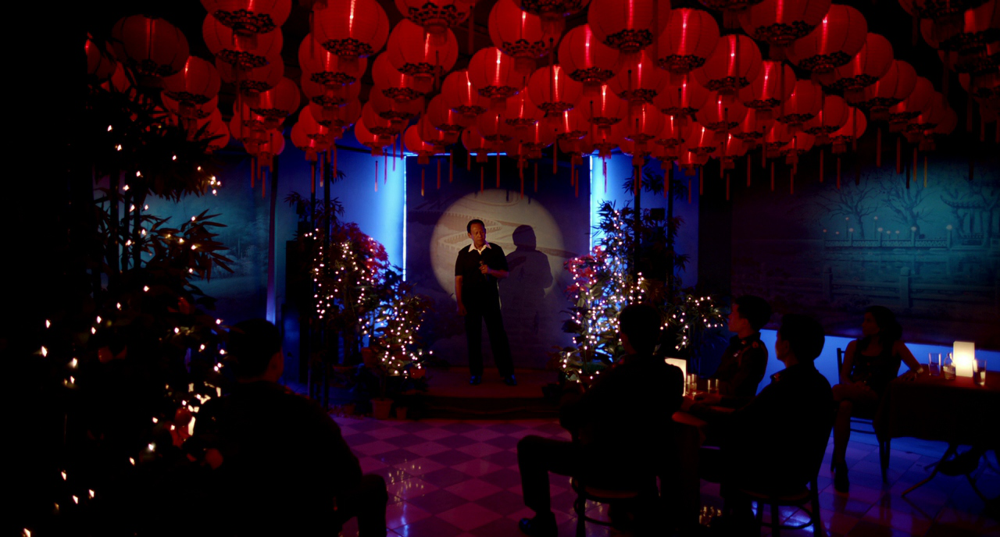

In [2]:
image_path = Path("stills/18 (795).jpg")
image = Image.open(image_path.open("rb"))
image

Convert it to a numpy array and check its dimensions

In [3]:
arr = np.array(image)
arr.shape

(688, 1280, 3)

Convert the 3D array (of height, width, color-channel) to be a 2D array (of pixel-number, color-channel).

In [4]:
pixels = arr.reshape((-1,3))
pixels.shape

(880640, 3)

Check the range of pixel values.

In [5]:
pixels.min(), pixels.mean(), pixels.max()

(0, 21.213414486434107, 255)

Re-center the pixels to be between 0 and 1

In [6]:
pixels = pixels.astype("float32") / 255
pixels.min(), pixels.mean(), pixels.max()

(0.0, 0.083189845, 1.0)

Let's examine a few stats about the color values

In [7]:
pixels.mean(0)

array([0.12709807, 0.03994883, 0.08304717], dtype=float32)

In [8]:
np.median(pixels,0)

array([0.04705882, 0.        , 0.00392157], dtype=float32)

Can we plot the color values as a histogram?

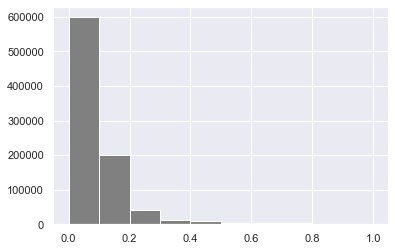

In [9]:
plt.hist(
    pixels.mean(1),
    color="grey"
);

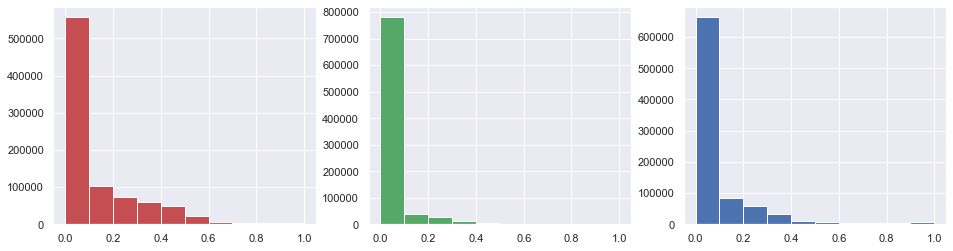

In [10]:
plt.figure(figsize=(16,4))
plt.subplot(1,3,1)
plt.hist(
    pixels[:,0],
    color="r"
)
plt.subplot(1,3,2)
plt.hist(
    pixels[:,1],
    color="g"
)
plt.subplot(1,3,3)
plt.hist(
    pixels[:,2],
    color="b"
);

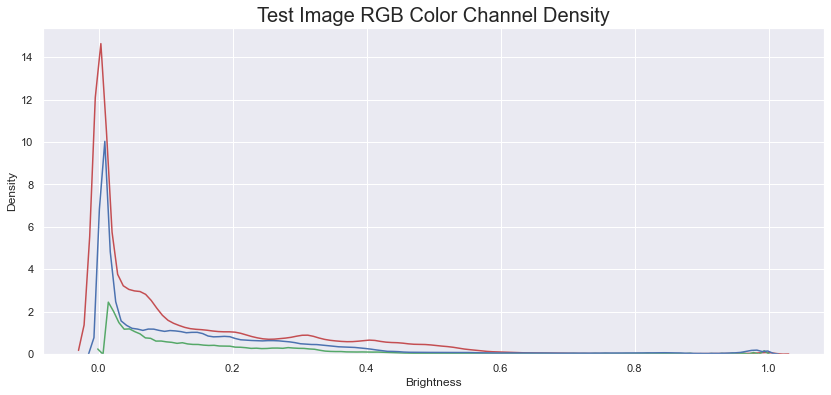

In [11]:
plt.figure(figsize=(14,6))
sns.kdeplot(
    pixels[:,0],
    color="r"
)
sns.kdeplot(
    pixels[:,1],
    color="g"
)
sns.kdeplot(
    pixels[:,2],
    color="b"
)
plt.xlabel("Brightness")
plt.ylabel("Density")
plt.title(
    "Test Image RGB Color Channel Density",
    fontsize=20
);

Now, on to grouping the pixels into a palette.

In [12]:
from sklearn.cluster import KMeans

In [13]:
kmeans = KMeans(n_clusters=8)
predictions = kmeans.fit_predict(pixels)
centers = kmeans.cluster_centers_

In [14]:
centers

array([[0.02074987, 0.00206349, 0.0106053 ],
       [0.23798603, 0.01276659, 0.04561184],
       [0.0861387 , 0.18529645, 0.38946605],
       [0.70839   , 0.82082736, 0.87526804],
       [0.46376288, 0.00515617, 0.00881614],
       [0.06802962, 0.04910506, 0.20132115],
       [0.49817854, 0.3167653 , 0.30011988],
       [0.22649036, 0.40695402, 0.8052878 ]], dtype=float32)

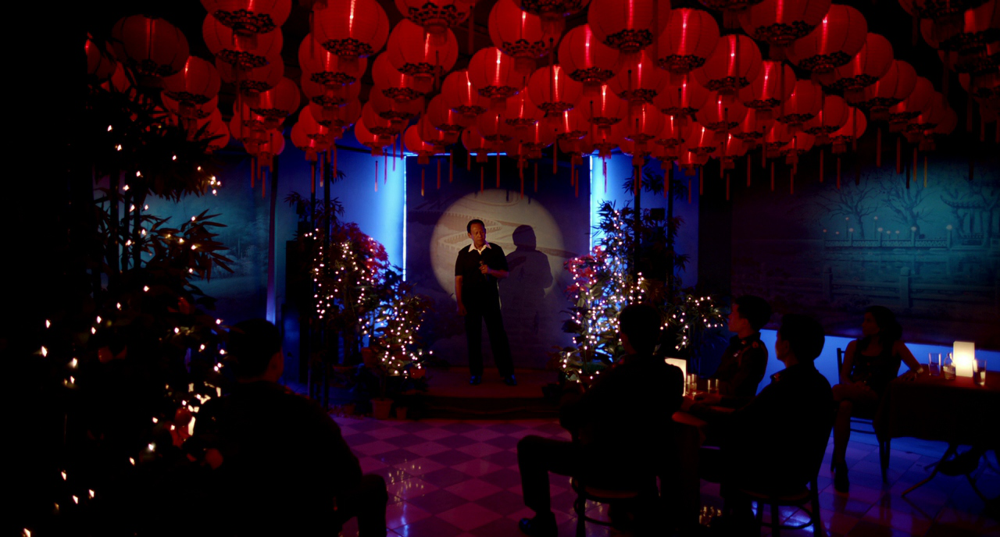

In [15]:
image

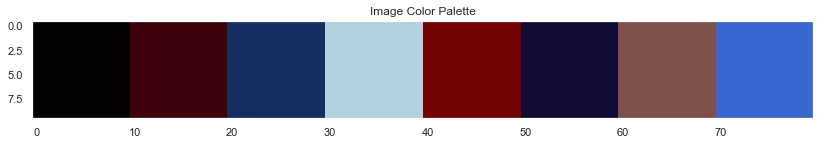

In [16]:
plt.figure(figsize=(14,8))
plt.imshow(centers[np.concatenate([[i] * 100 for i in range(len(centers))]).reshape((-1,10)).T])
plt.title("Image Color Palette")
plt.grid()

In [17]:
def kmeans_nclusters(n=8):
    return KMeans(n_clusters=n).fit(pixels).cluster_centers_

Now let's try it with a few different palette widths

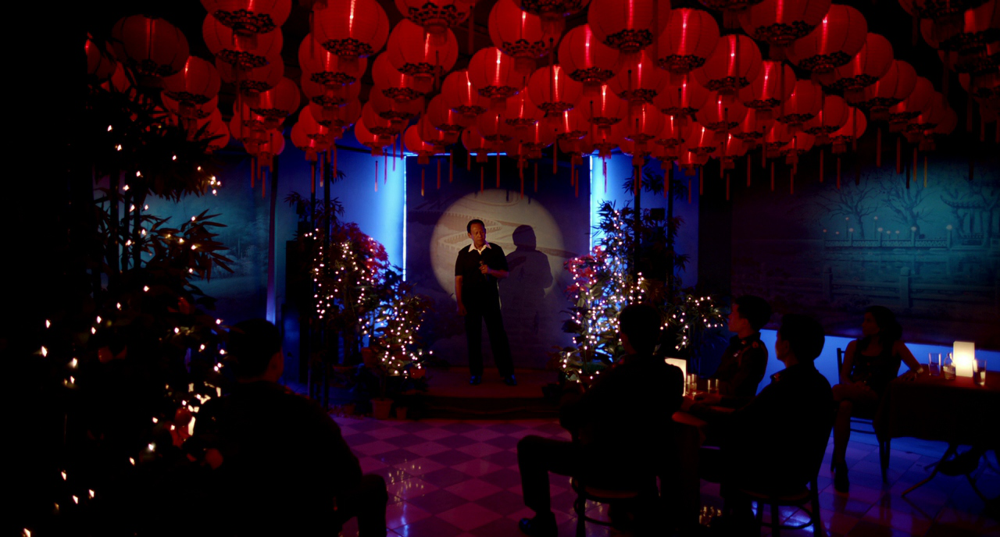

In [18]:
image

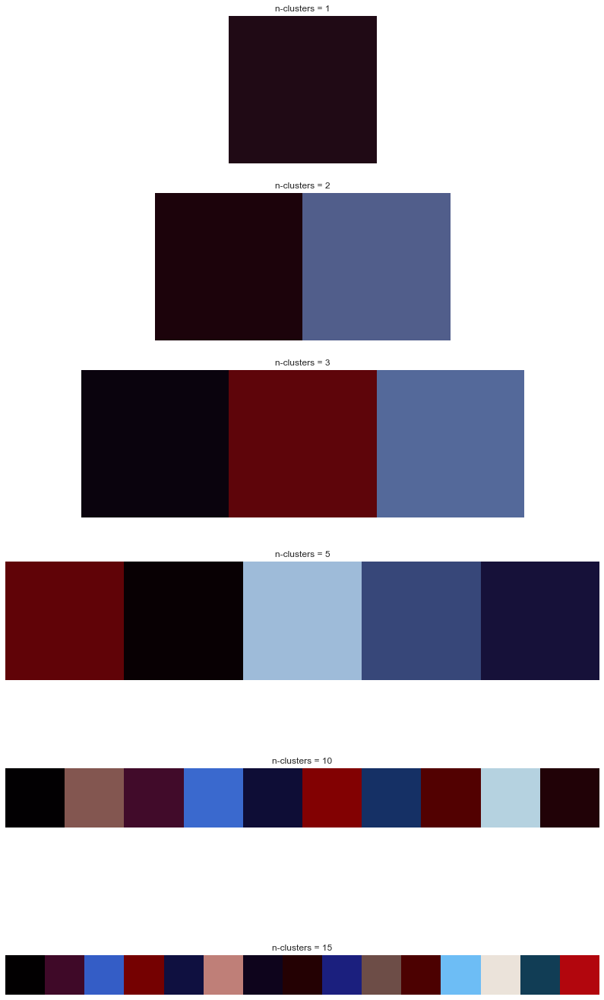

In [19]:
plt.figure(figsize=(14,25))
palette_sizes = [1,2,3,5,10,15]
for i, s in enumerate(palette_sizes):
    plt.subplot(len(palette_sizes),1,i+1)
    kmcenters = kmeans_nclusters(s)    
    plt.imshow(kmcenters[np.concatenate([[i] * 100 for i in range(len(kmcenters))]).reshape((-1,10)).T])
    plt.title(f"n-clusters = {s}")
    plt.grid()
    plt.axis('off')
plt.show()

Now we can try applying this to the rest of the test images

In [20]:
def read_image(path):
    with open(path,"rb") as f:
        return np.array(Image.open(f))

def preprocess_image(img):
    return img.reshape((-1,3)).astype("float32") / 255

def get_kmeans_centers(img,nclusters):
    return KMeans(n_clusters=nclusters).fit(img).cluster_centers_

def make_kmeans_palette(path,nclusters=8):
    # Load the image
    img = read_image(path)
    # Reshape and set range
    pixels = preprocess_image(img)
    # Cluster the pixels
    centers = get_kmeans_centers(pixels,nclusters)
    # Plot the image
    plt.figure(figsize=(14,8))
    plt.imshow(img)
    plt.grid()
    plt.axis('off')
    plt.show()
    # Plot the palette
    plt.figure(figsize=(14,6))
    plt.imshow(centers[
        np.concatenate([[i] * 100 for i in range(len(centers))]).reshape((-1,10)).T
    ])
    plt.grid()
    plt.axis('off')
    plt.show()

K-Means clustering with 8 centers...
---------------------------------------------

Image: stills/18 (795).jpg


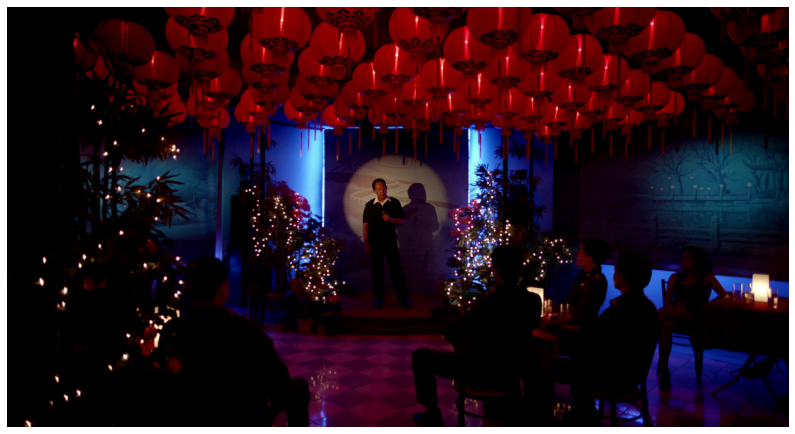

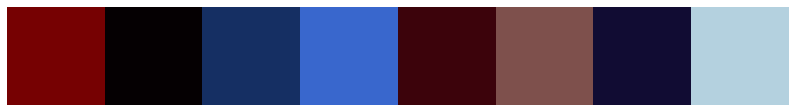

Image: stills/13 (795).jpg


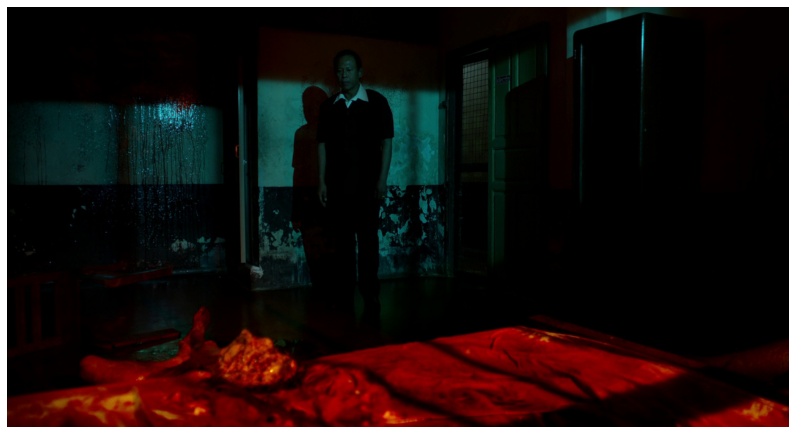

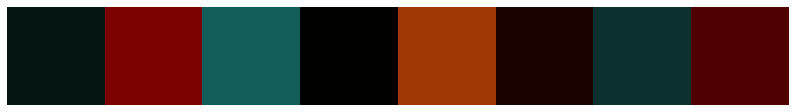

Image: stills/09 (776).jpg


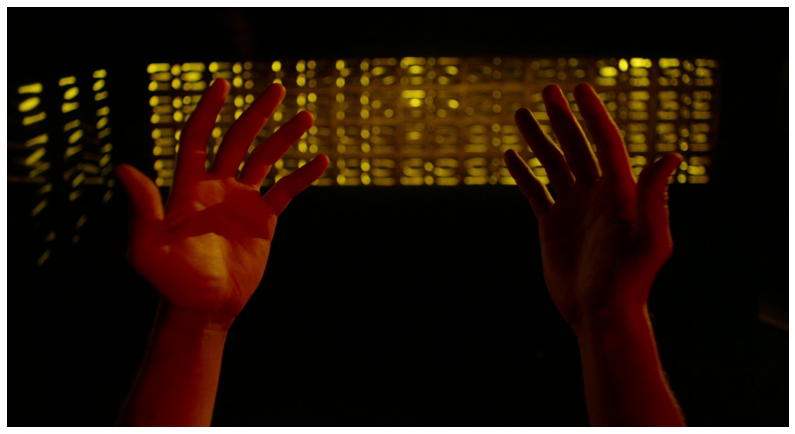

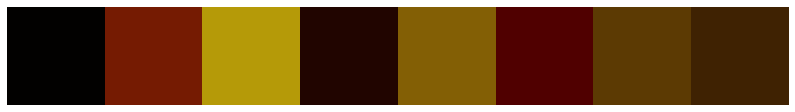

Image: stills/03 (776).jpg


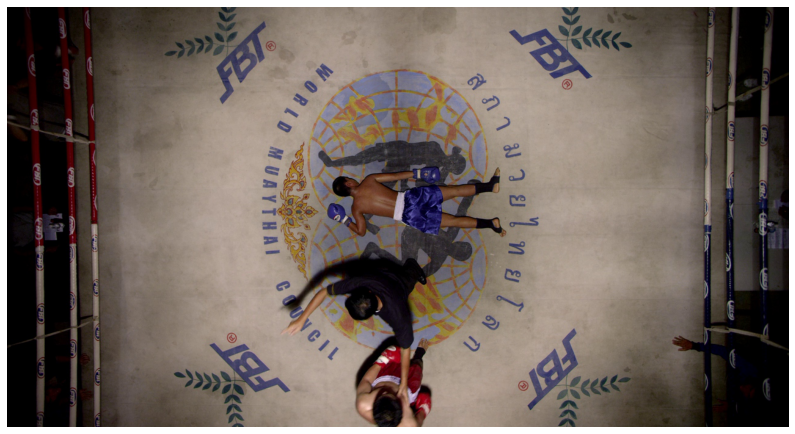

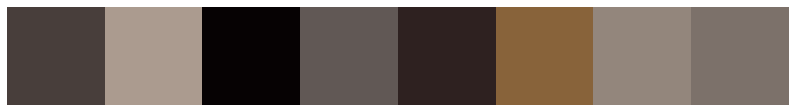

Image: stills/11 (795).jpg


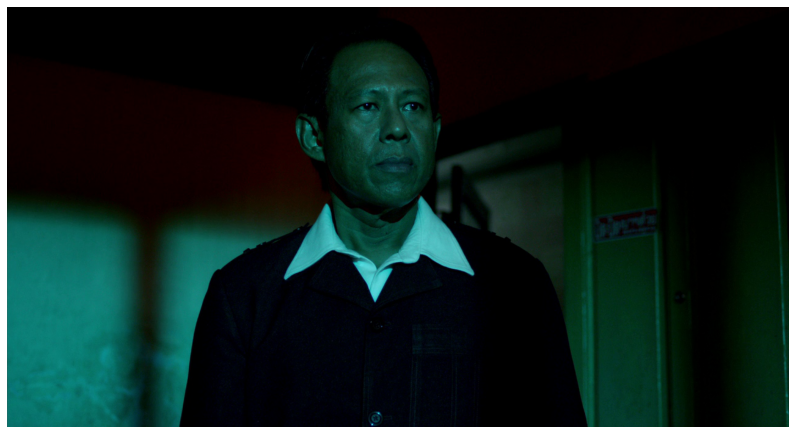

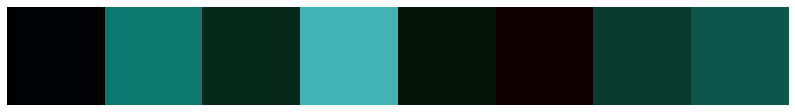

In [21]:
print("K-Means clustering with 8 centers...")
print("-" * 45 + "\n")
for img_path in Path("stills").glob("*.jpg"):
    print("Image:",img_path)
    make_kmeans_palette(img_path)

KMeans seems to do a pretty reasonable job of picking color palettes right out of the box.

One thing to note is that it seems to really average out the colors in the image. If you look at the image `stills/03 (776).jpg`, you might expect it to include some red or blue from the ropes or the mat – they stand out even though there isn't much of either one – but they aren't included because there isn't enough for KMeans to think it's important.

Now, let's try the same technique with a different clustering algorithm

In [22]:
from sklearn.cluster import AgglomerativeClustering

In [23]:
def read_image(path):
    with open(path,"rb") as f:
        return np.array(Image.open(f))

def preprocess_image(img):
    return img.reshape((-1,3)).astype("float32") / 255

def get_kmeans_centers(img,nclusters):
    return KMeans(n_clusters=nclusters).fit(img).cluster_centers_

def get_agglom_centers(img,nclusters):
    return AgglomerativeClustering(n_clusters=nclusters).fit(img).cluster_centers_

def plot_image(img):
    plt.figure(figsize=(14,8))
    plt.imshow(img)
    plt.grid()
    plt.axis('off')
    plt.show()

def plot_palette(centers):
    plt.figure(figsize=(14,6))
    plt.imshow(centers[
        np.concatenate([[i] * 100 for i in range(len(centers))]).reshape((-1,10)).T
    ])
    plt.grid()
    plt.axis('off')
    plt.show()

def make_agglom_palette(path,nclusters=8):
    # Load the image
    img = read_image(path)
    
    # Reshape and set range
    pixels = preprocess_image(img)
    
    # Cluster the pixels
    agglom_centers = get_kmeans_centers(pixels,nclusters)
    
    # Plot the image
    plot_image(img)
    
    # Plot the palette
    plot_palette(agglom_centers)

Agglomerative clustering with 8 centers...
---------------------------------------------

Image: stills/18 (795).jpg


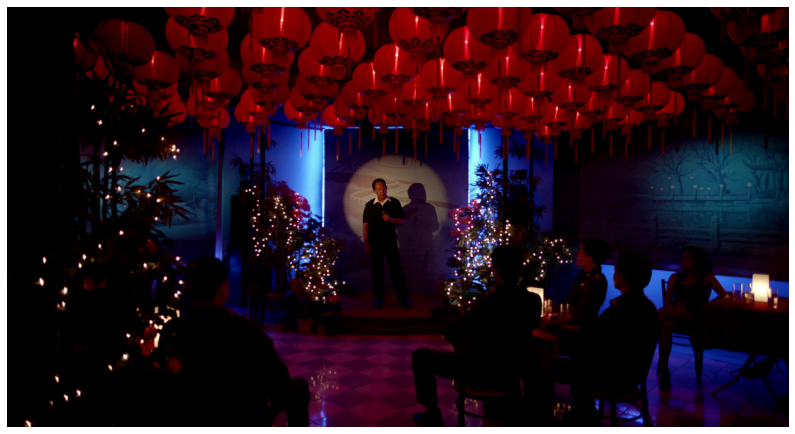

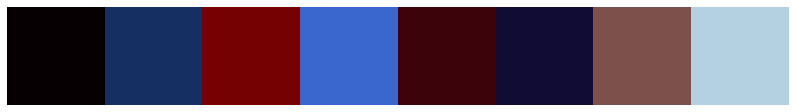

Image: stills/13 (795).jpg


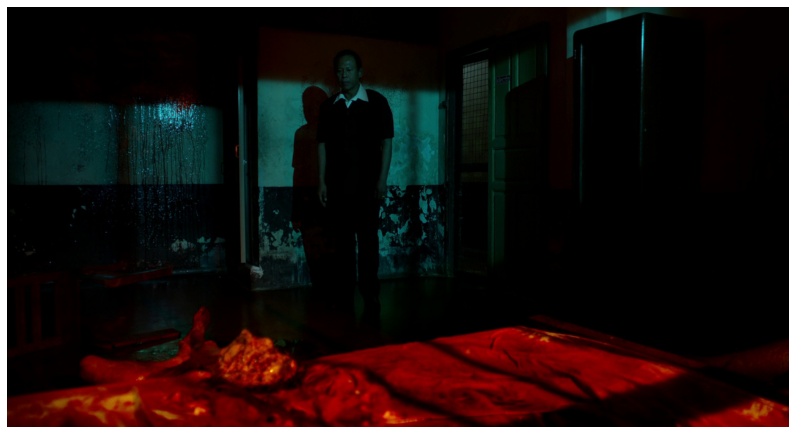

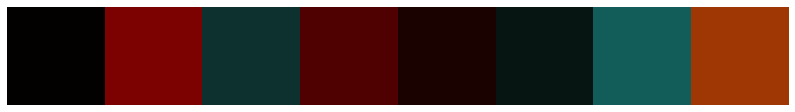

Image: stills/09 (776).jpg


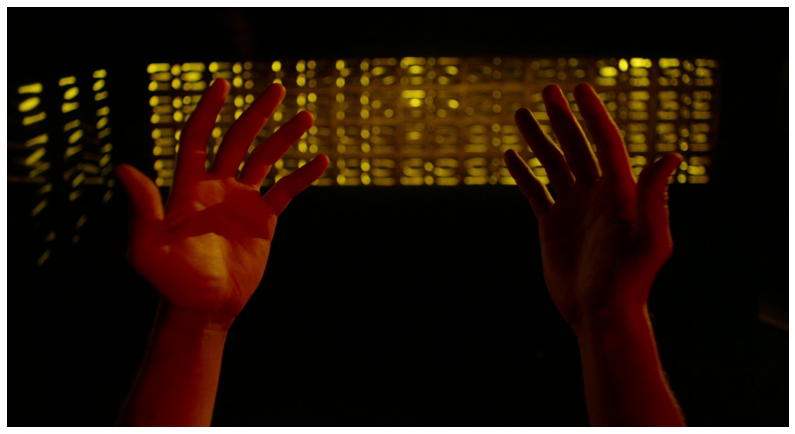

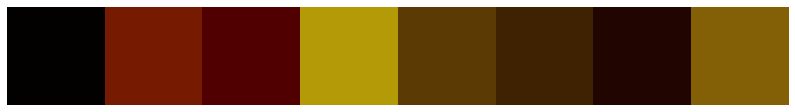

Image: stills/03 (776).jpg


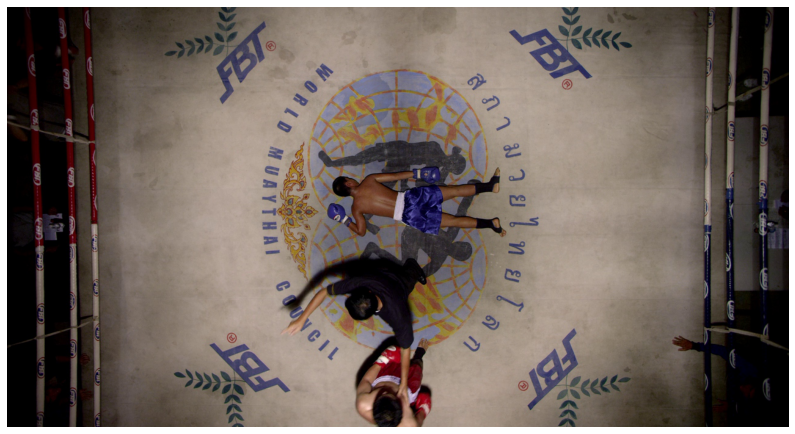

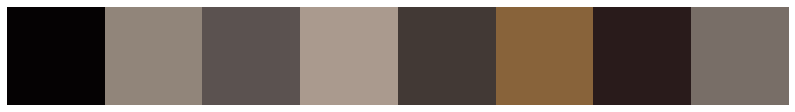

Image: stills/11 (795).jpg


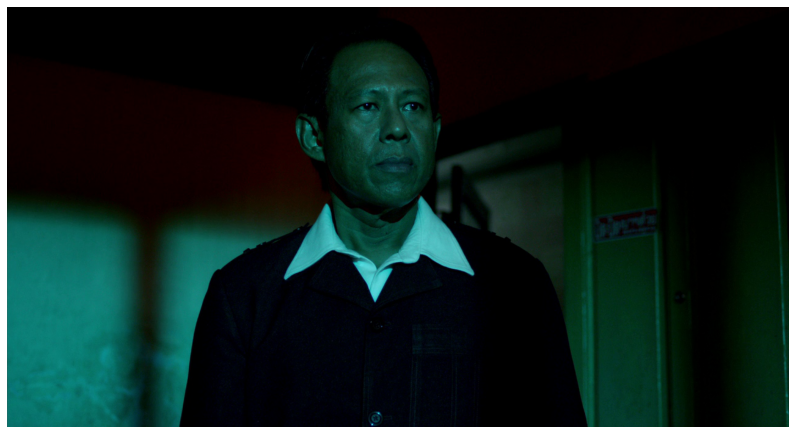

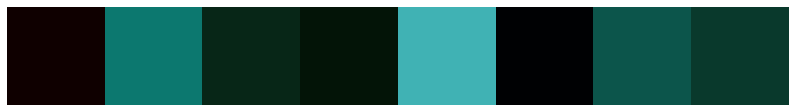

In [24]:
print("Agglomerative clustering with 8 centers...")
print("-" * 45 + "\n")
for img_path in Path("stills").glob("*.jpg"):
    print("Image:",img_path)
    make_agglom_palette(img_path)

In [25]:
def read_image(path):
    with open(path,"rb") as f:
        return np.array(Image.open(f))

def preprocess_image(img):
    return img.reshape((-1,3)).astype("float32") / 255

def get_kmeans_centers(img,nclusters):
    return KMeans(n_clusters=nclusters).fit(img).cluster_centers_

def get_agglom_centers(img,nclusters):
    return AgglomerativeClustering(n_clusters=nclusters).fit(img).cluster_centers_

def plot_image(img):
    plt.figure(figsize=(14,8))
    plt.imshow(img)
    plt.grid()
    plt.axis('off')
    plt.show()

def plot_palette(centers):
    plt.figure(figsize=(14,6))
    plt.imshow(centers[
        np.concatenate([[i] * 100 for i in range(len(centers))]).reshape((-1,10)).T
    ])
    plt.grid()
    plt.axis('off')
    plt.show()

def make_all_palettes(path,nclusters=8):
    # Load the image
    img = read_image(path)
    
    # Reshape and set range
    pixels = preprocess_image(img)
    
    # Cluster the pixels
    km_centers = get_kmeans_centers(pixels,nclusters)
    agglom_centers = get_kmeans_centers(pixels,nclusters)
    
    # Plot the image
    plot_image(img)
    
    # Plot the palette
    print("KMeans clustering")
    plot_palette(km_centers)
    print("Agglomerative clustering")
    plot_palette(agglom_centers)
    
    print("\n" + "=" * 100 + "\n")

KMeans + Agglomerative clustering with 8 centers...
-----------------------------------------------------------------

Image: stills/18 (795).jpg


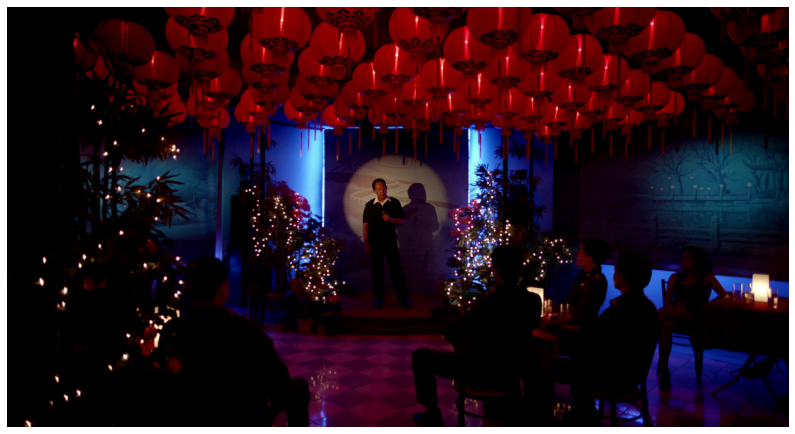

KMeans clustering


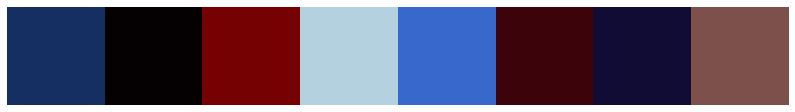

Agglomerative clustering


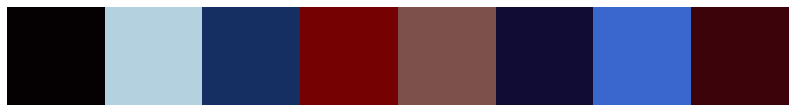



Image: stills/13 (795).jpg


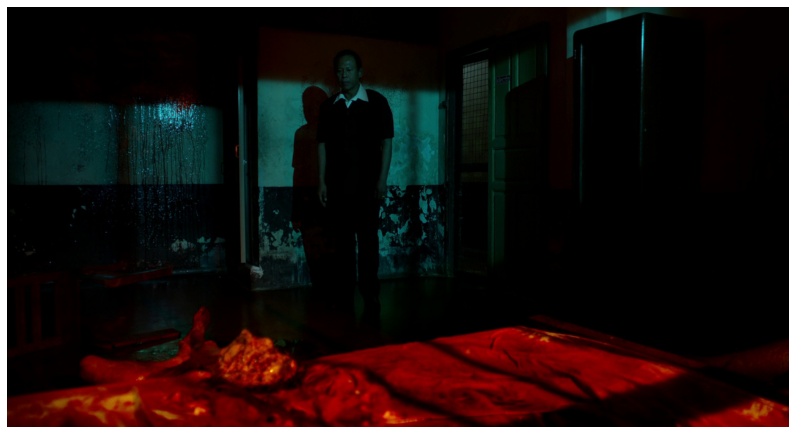

KMeans clustering


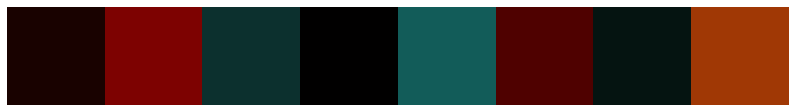

Agglomerative clustering


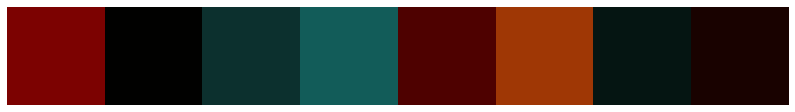



Image: stills/09 (776).jpg


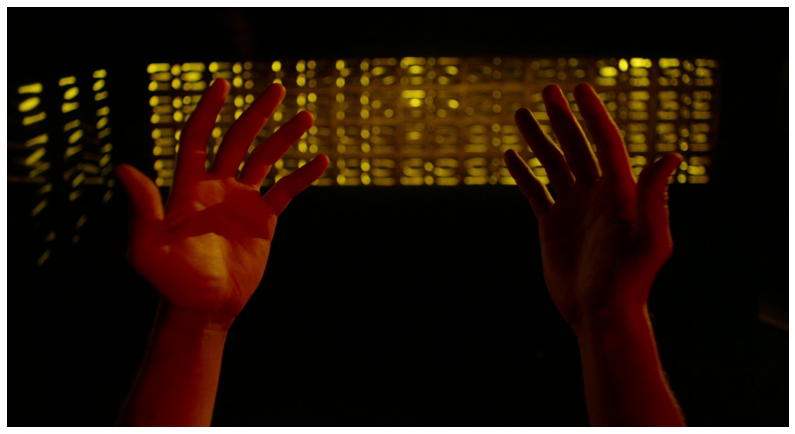

KMeans clustering


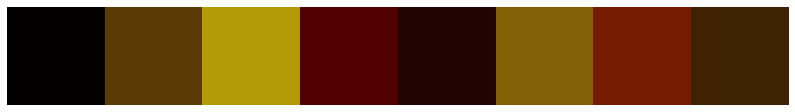

Agglomerative clustering


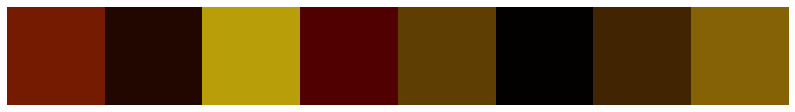



Image: stills/03 (776).jpg


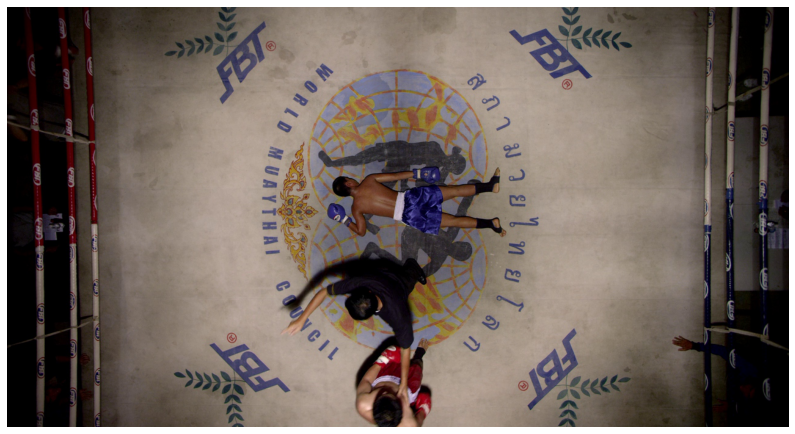

KMeans clustering


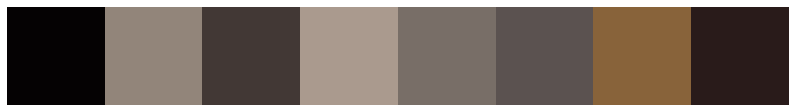

Agglomerative clustering


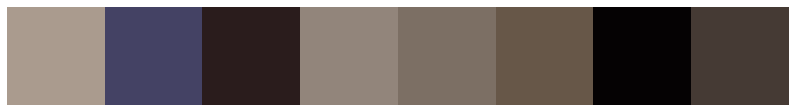



Image: stills/11 (795).jpg


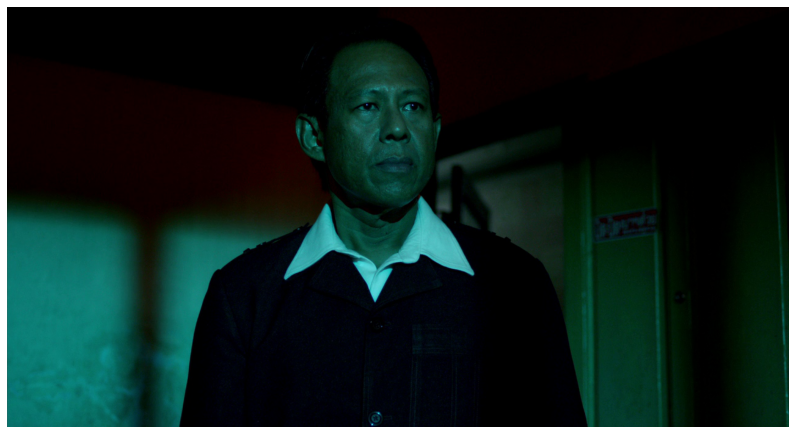

KMeans clustering


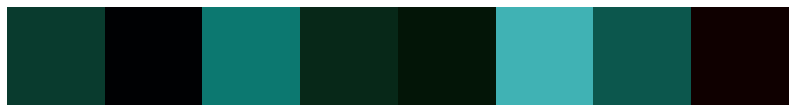

Agglomerative clustering


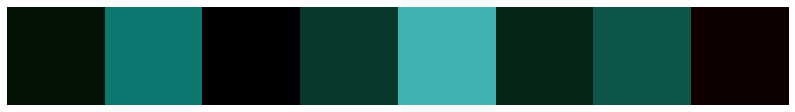

In [26]:
print("KMeans + Agglomerative clustering with 8 centers...")
print("-" * 65 + "\n")
for img_path in Path("stills").glob("*.jpg"):
    print("Image:",img_path)
    make_all_palettes(img_path)

What if we converted the images from RGB to HSV for clustering?

In [27]:
from skimage import color

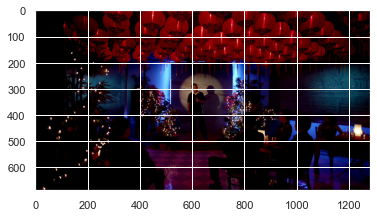

In [30]:
plt.imshow(arr)

In [58]:
color.rgb2hsv(arr).reshape((-1,3)).mean(0)

array([0.37988009, 0.69305503, 0.17041741])

In [51]:
color.rgb2hsv(arr.astype("float32") / 255).reshape((-1,3)).mean(0)

array([0.37981305, 0.69310915, 0.17090099], dtype=float32)

In [59]:
color.rgb2hsv(arr.astype("float32") / 255).reshape((-1,3)).mean(0)

array([0.37981305, 0.69310915, 0.17090099], dtype=float32)

In [67]:
def rgb2hsv(dat):
    return color.rgb2hsv([dat])[0]

def hsv2rgb(dat):
    return color.hsv2rgb([dat])[0]

In [69]:
def make_all_palettes(path,nclusters=8):
    # Load the image
    img = read_image(path)
    
    # Reshape and set range
    rgb_pixels = preprocess_image(img)
    hsv_pixels = rgb2hsv(rgb_pixels)
    
    # Cluster the pixels
    km_rgb_centers = get_kmeans_centers(rgb_pixels,nclusters)
    km_hsv_centers = get_kmeans_centers(hsv_pixels,nclusters)
    km_hsv_centers = hsv2rgb(km_hsv_centers)
    
    agglom_rgb_centers = get_kmeans_centers(rgb_pixels,nclusters)
    agglom_hsv_centers = get_kmeans_centers(hsv_pixels,nclusters)
    agglom_hsv_centers = hsv2rgb(agglom_hsv_centers)
    
    # Plot the image
    plot_image(img)
    
    # Plot the palette
    print("KMeans RGB clustering")
    plot_palette(km_rgb_centers)
    print("KMeans HSV clustering")
    plot_palette(km_hsv_centers)
    
    print("Agglomerative RGB clustering")
    plot_palette(agglom_rgb_centers)
    print("Agglomerative HSV clustering")
    plot_palette(agglom_hsv_centers)
    
    print("\n" + "=" * 100 + "\n")

KMeans + Agglomerative clustering for RGB + HSV with 8 centers...
-----------------------------------------------------------------

Image: stills/18 (795).jpg


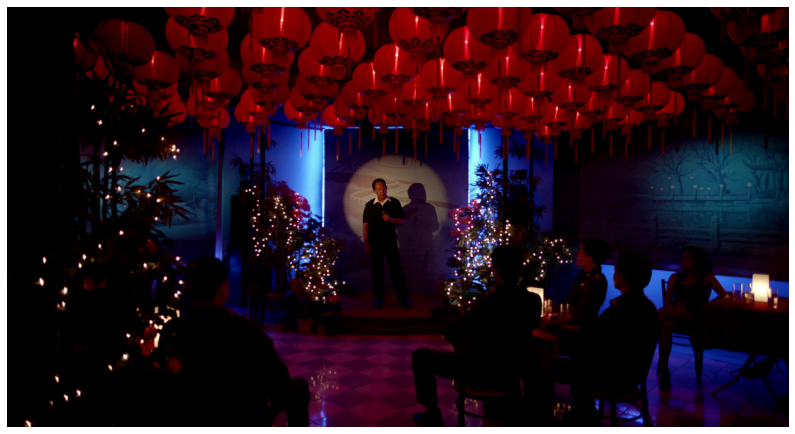

KMeans RGB clustering


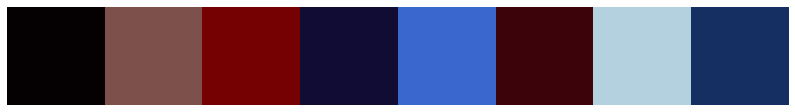

KMeans HSV clustering


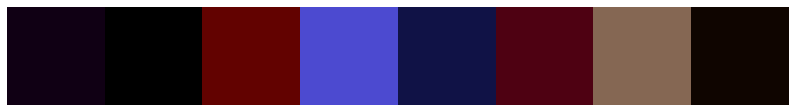

Agglomerative RGB clustering


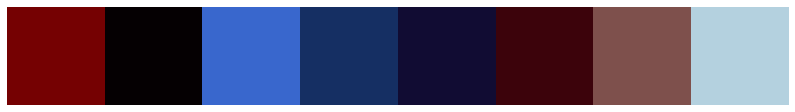

Agglomerative HSV clustering


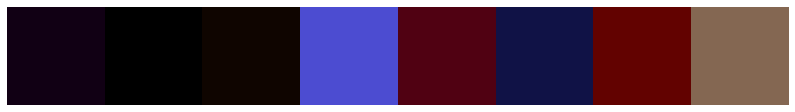



Image: stills/13 (795).jpg


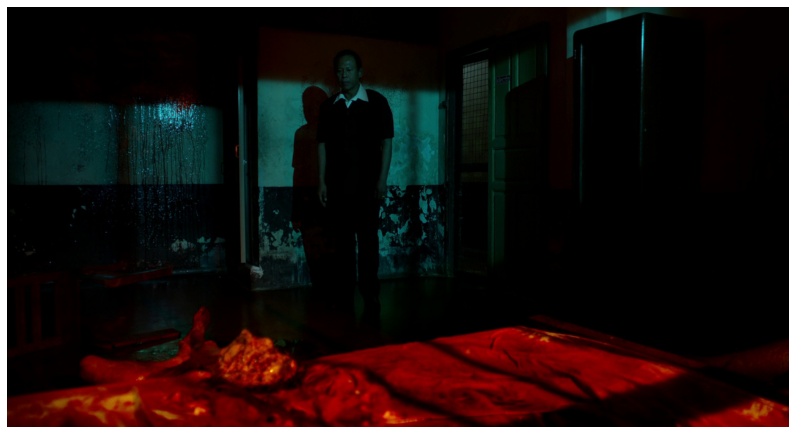

KMeans RGB clustering


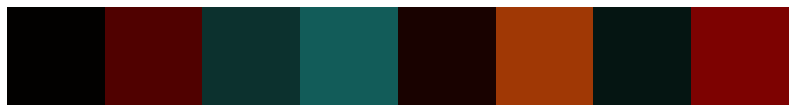

KMeans HSV clustering


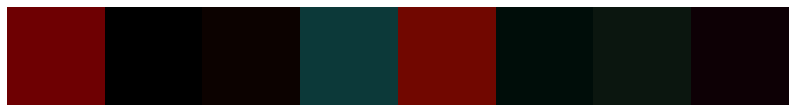

Agglomerative RGB clustering


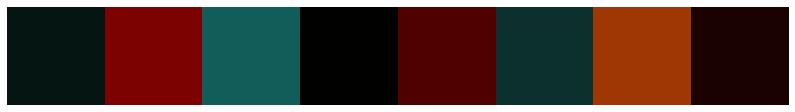

Agglomerative HSV clustering


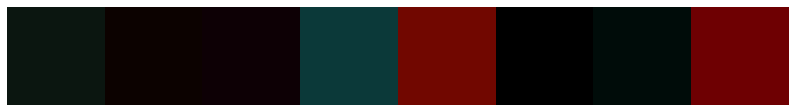



Image: stills/09 (776).jpg


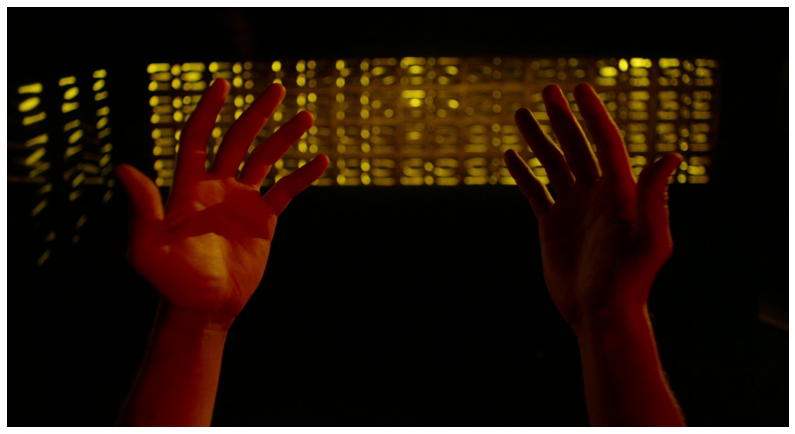

KMeans RGB clustering


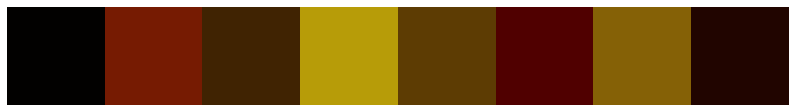

KMeans HSV clustering


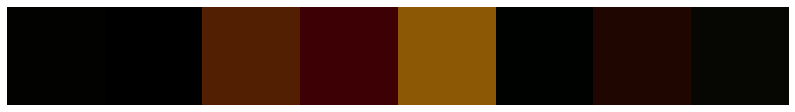

Agglomerative RGB clustering


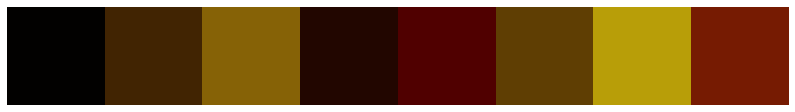

Agglomerative HSV clustering


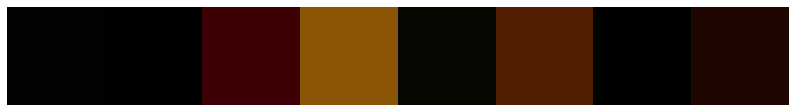



Image: stills/03 (776).jpg


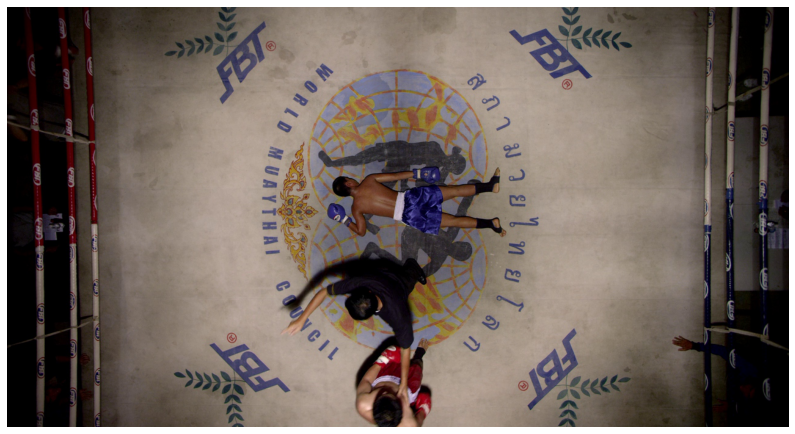

KMeans RGB clustering


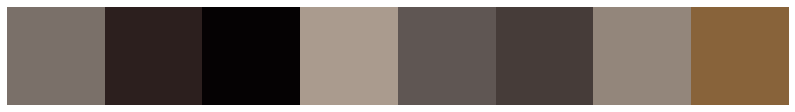

KMeans HSV clustering


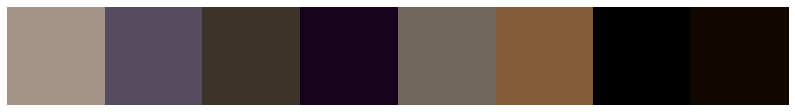

Agglomerative RGB clustering


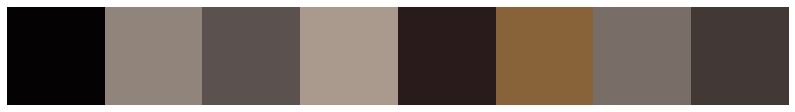

Agglomerative HSV clustering


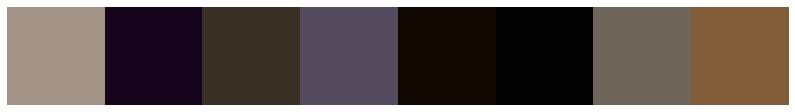



Image: stills/11 (795).jpg


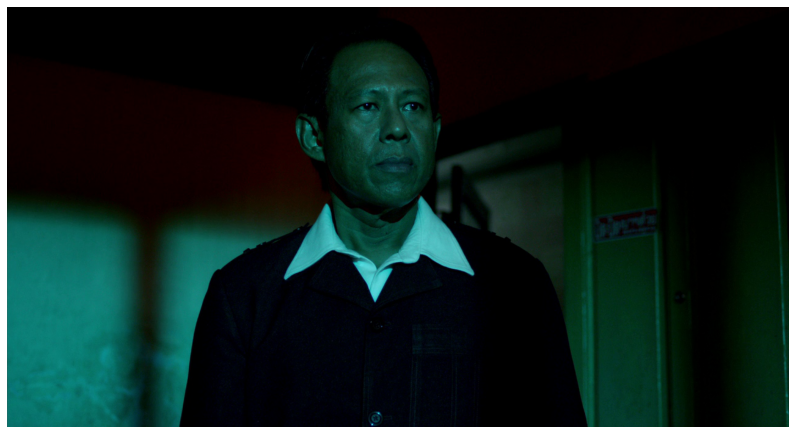

KMeans RGB clustering


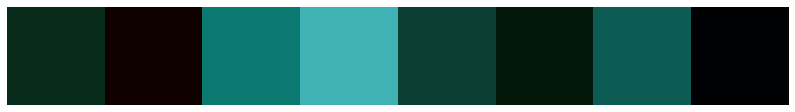

KMeans HSV clustering


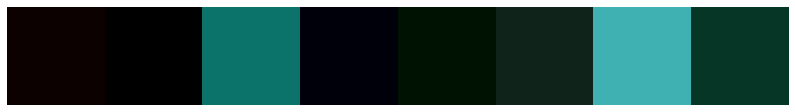

Agglomerative RGB clustering


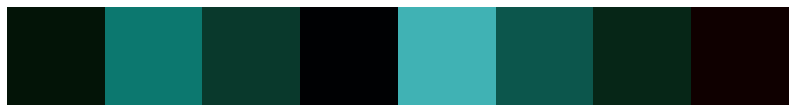

Agglomerative HSV clustering


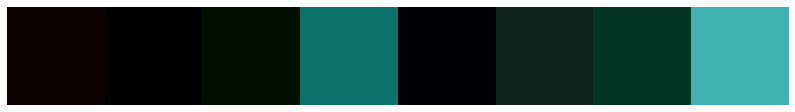

In [70]:
print("KMeans + Agglomerative clustering for RGB + HSV with 8 centers...")
print("-" * 65 + "\n")
for img_path in Path("stills").glob("*.jpg"):
    print("Image:",img_path)
    make_all_palettes(img_path)